In [2]:
import ImageView: imshow
import Images: Gray
import TestImages: testimage

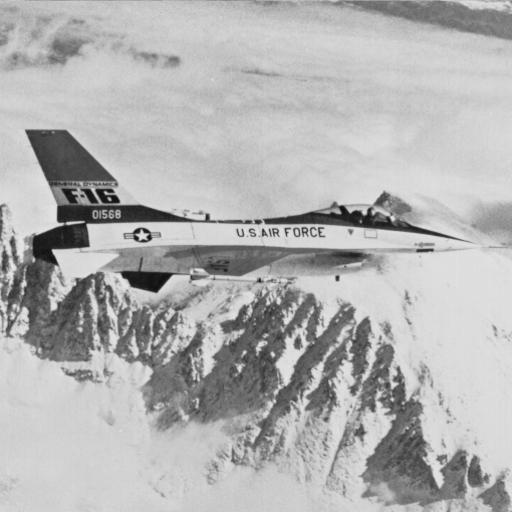

In [3]:
jetplane = 1*Gray.(testimage("jetplane"))

In [4]:
typeof(jetplane)

Matrix{Gray{Float32}} (alias for Array{Gray{Float32}, 2})

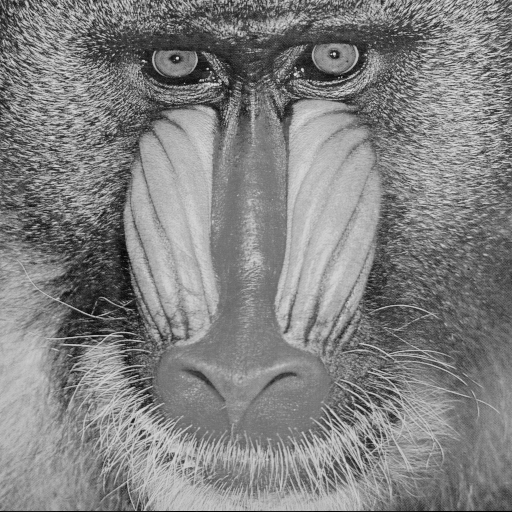

In [5]:
mandrill = 1*Gray.(testimage("mandrill"))

In [6]:
function normalize_image(im)
    im_res = im .- minimum(im)
    return (1/maximum(im_res))*im_res
end

normalize_image (generic function with 1 method)

In [7]:
m = convert(Matrix{Float32}, mandrill)

512×512 Matrix{Float32}:
 0.568627   0.219608   0.192157   0.34902   …  0.443137  0.6        0.694118
 0.454902   0.396078   0.156863   0.262745     0.509804  0.584314   0.490196
 0.301961   0.447059   0.180392   0.180392     0.392157  0.345098   0.317647
 0.278431   0.533333   0.372549   0.188235     0.286275  0.294118   0.27451
 0.341176   0.478431   0.517647   0.196078     0.231373  0.313726   0.337255
 0.321569   0.298039   0.623529   0.239216  …  0.333333  0.596078   0.713726
 0.168627   0.2        0.52549    0.509804     0.72549   0.776471   0.643137
 0.129412   0.2        0.435294   0.6          0.631373  0.470588   0.541176
 0.223529   0.188235   0.219608   0.458824     0.529412  0.611765   0.478431
 0.14902    0.12549    0.188235   0.25098      0.254902  0.317647   0.533333
 0.129412   0.168627   0.223529   0.145098  …  0.254902  0.286275   0.266667
 0.129412   0.184314   0.305882   0.141176     0.34902   0.290196   0.294118
 0.141176   0.262745   0.352941   0.254902     0.301

In [8]:
j = convert(Matrix{Float32}, jetplane)

512×512 Matrix{Float32}:
 0.756863  0.72549   0.698039  0.721569  …  0.647059  0.643137  0.576471
 0.74902   0.764706  0.760784  0.745098     0.698039  0.611765  0.545098
 0.756863  0.772549  0.760784  0.74902      0.745098  0.611765  0.54902
 0.733333  0.72549   0.72549   0.698039     0.819608  0.745098  0.643137
 0.701961  0.701961  0.698039  0.709804     0.815686  0.807843  0.72549
 0.678431  0.694118  0.694118  0.690196  …  0.780392  0.811765  0.776471
 0.694118  0.682353  0.670588  0.705882     0.666667  0.74902   0.768627
 0.666667  0.65098   0.658824  0.686275     0.6       0.67451   0.745098
 0.666667  0.643137  0.666667  0.647059     0.654902  0.698039  0.760784
 0.666667  0.666667  0.666667  0.654902     0.666667  0.705882  0.768627
 0.705882  0.690196  0.698039  0.67451   …  0.596078  0.65098   0.686275
 0.721569  0.682353  0.686275  0.662745     0.627451  0.654902  0.678431
 0.694118  0.721569  0.698039  0.713726     0.67451   0.737255  0.733333
 ⋮                          

In [9]:
import LinearAlgebra: transpose, norm

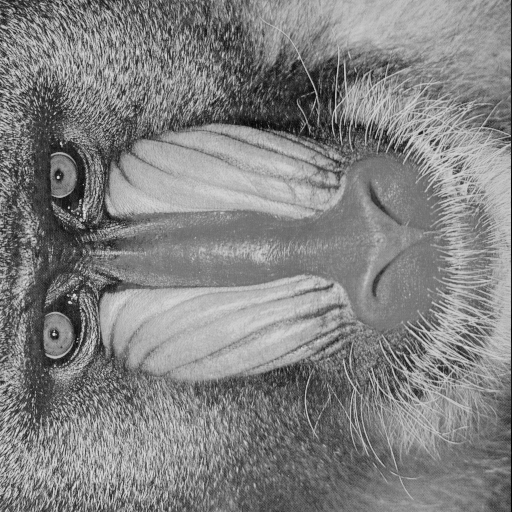

In [10]:
transpose(mandrill)

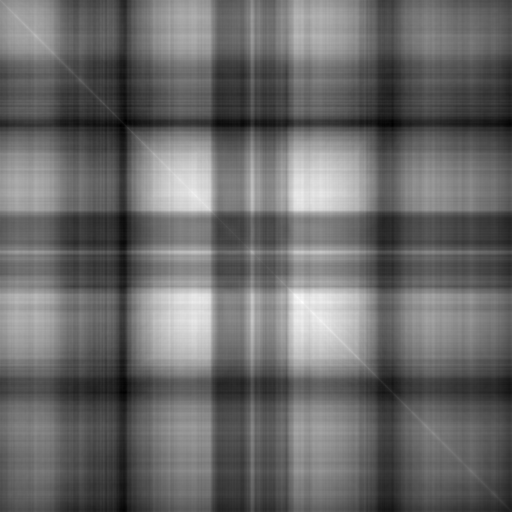

In [11]:
Gray.(normalize_image(transpose(m)*m))

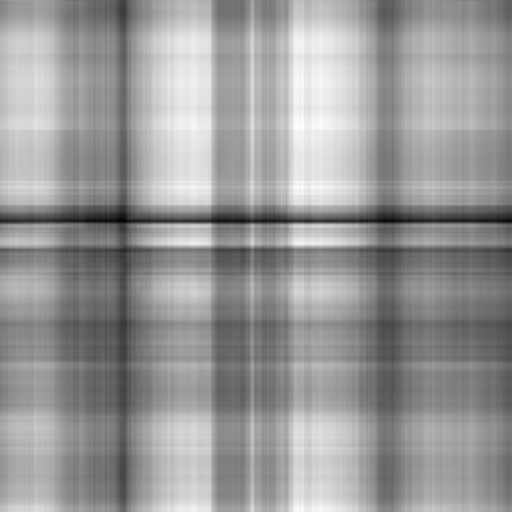

In [12]:
Gray.(normalize_image(j*m))

In [13]:
norm_columns(f, x) = f.(x) ./ sum(f.(x), dims=1)

norm_rows(f, x) = f.(x) ./ sum(f.(x), dims=2)

norm_rows (generic function with 1 method)

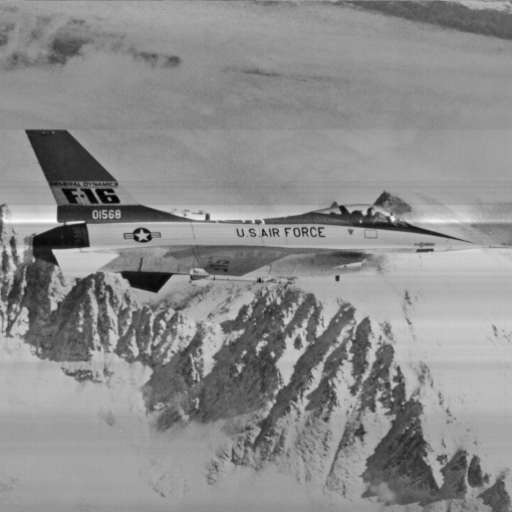

In [14]:
nr_j = normalize_image(norm_rows(x -> x+1, j))
Gray.(nr_j)

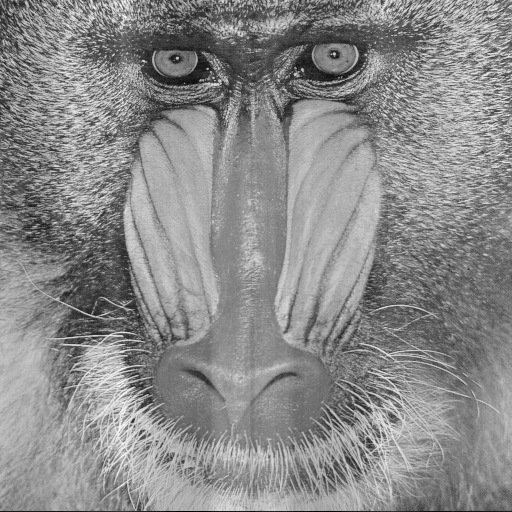

In [15]:
nc_m = normalize_image(norm_columns(x -> x+1, m))
Gray.(nc_m)

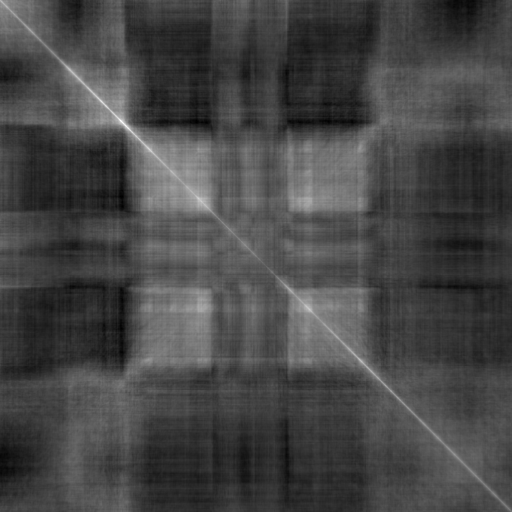

In [16]:
Gray.(normalize_image(transpose(nc_m)*nc_m))

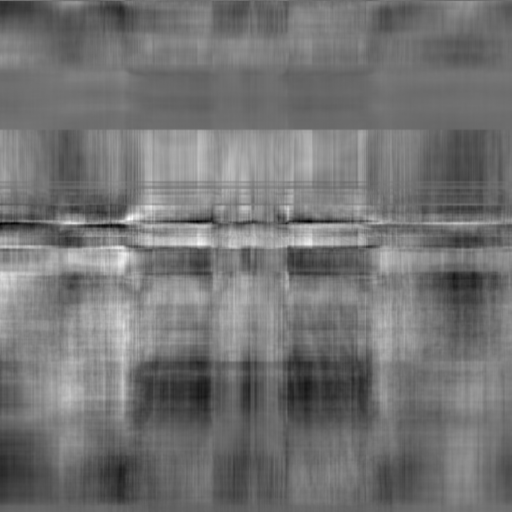

In [17]:
Gray.(normalize_image(nr_j*nc_m))

In [18]:
function warp3(x, y, p) # 0:31
    knob = p[:knob]
    clip(n, nsize) = max(min(nsize, n), 1)
    (xnew, ynew) =
        (clip(x + 10 * ((knob - 16) / 16) * sin(y/4), p[:xsize]), y)
    xnew, ynew
end

warp3 (generic function with 1 method)

In [19]:
function apply_warp(warp, im, p)
    (xsize, ysize) = size(im)
    p[:xsize] = xsize
    p[:ysize] = ysize
    function linear_interpolation(x_y)
        # a rough draft, this can be improved; works on im
        x = x_y[1]
        y = x_y[2]
        dx=mod(x,1)
        dy=mod(y,1)
        x_left = floor(Int,x)
        y_left = floor(Int,y)
        x_right = min(x_left + 1, xsize)
        y_right = min(y_left + 1, ysize)
        im[x_left,y_left]*(1-dx)*(1-dy) + im[x_left,y_right]*(1-dx)*dy + im[x_right,y_left]*dx*(1-dy) + im[x_right, y_right]*dx*dy
    end
    [linear_interpolation(warp(x,y,p)) for x in 1:xsize, y in 1:ysize]
end

apply_warp (generic function with 1 method)

In [20]:
pars = Dict(:knob=>0, :dummy=>0.0)
# at least one of the above should be float and not integer, so that the dictionary type is
# Dict{Symbol, Real}  and not Dict{Symbol, Int64}

Dict{Symbol, Real} with 2 entries:
  :dummy => 0.0
  :knob  => 0

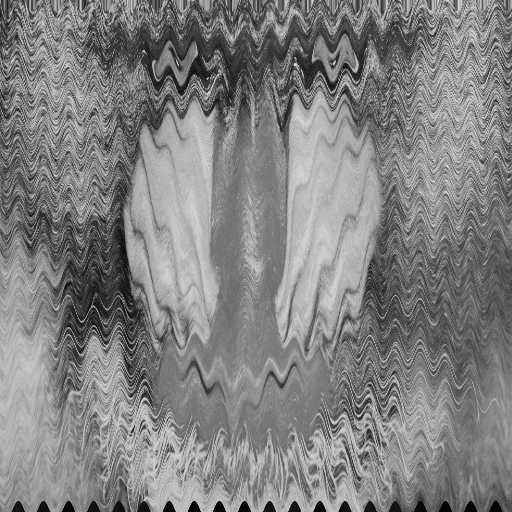

In [21]:
m_warped = apply_warp(warp3, m, pars)
Gray.(m_warped)

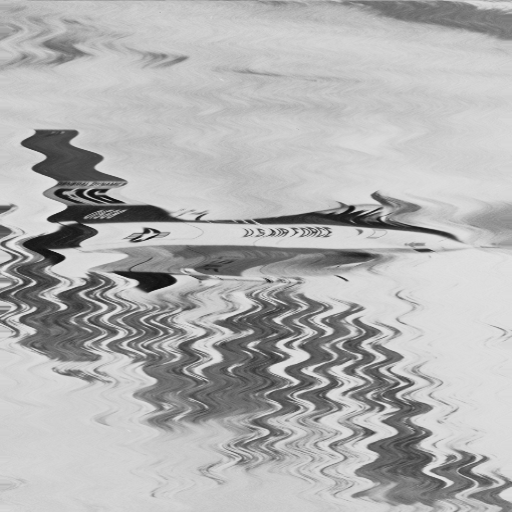

In [24]:
j_warped = transpose(apply_warp(warp3, transpose(j), pars))
Gray.(j_warped)

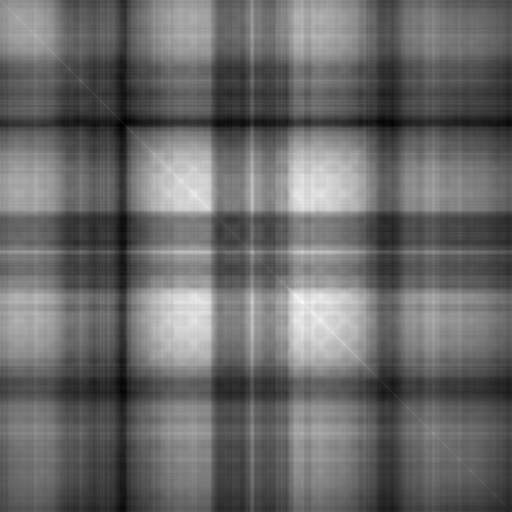

In [25]:
Gray.(normalize_image(transpose(m_warped)*m_warped))

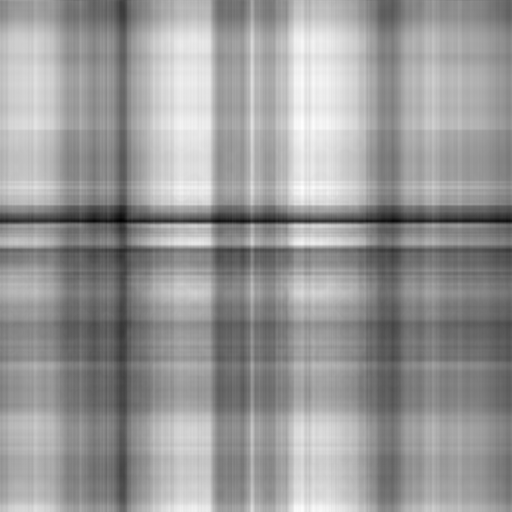

In [26]:
Gray.(normalize_image(j_warped*m_warped))

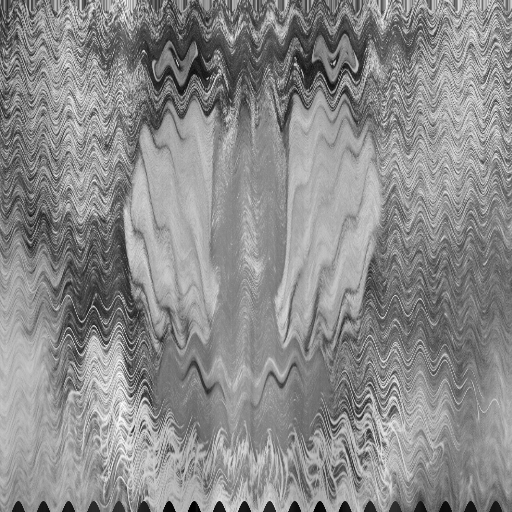

In [27]:
nc_m_warped = normalize_image(norm_columns(x -> x+1, m_warped))
Gray.(nc_m_warped)

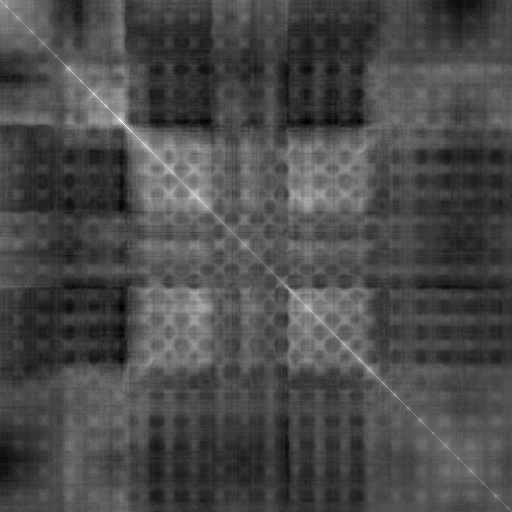

In [28]:
Gray.(normalize_image(transpose(nc_m_warped)*nc_m_warped))

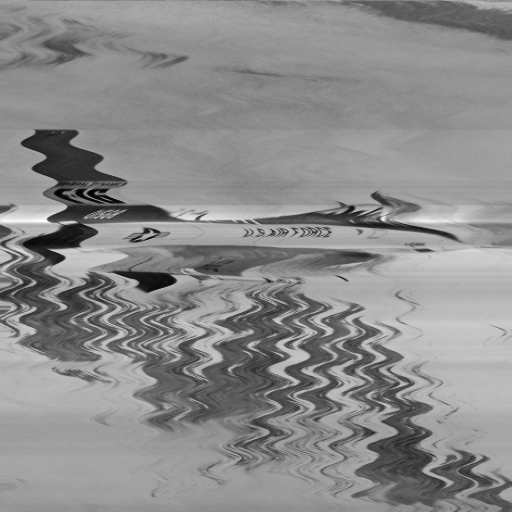

In [29]:
nr_j_warped = normalize_image(norm_rows(x -> x+1, j_warped))
Gray.(nr_j_warped)

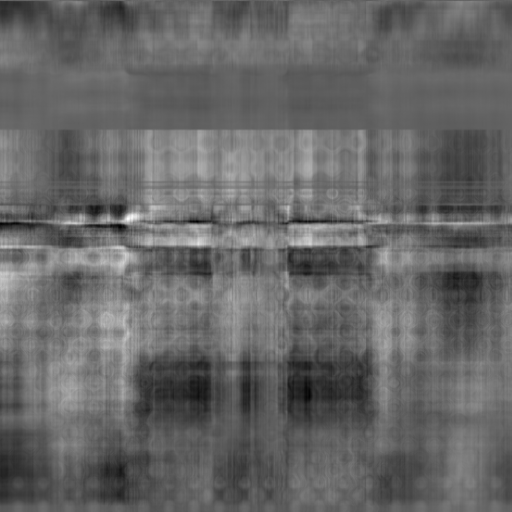

In [30]:
Gray.(normalize_image(nr_j_warped*nc_m_warped))

In [32]:
transposed_product(x) = normalize_image(transpose(x)*x)

transposed_product (generic function with 1 method)

In [33]:
value3(A) = transposed_product(norm_columns(x -> x+1, A))

value3 (generic function with 1 method)

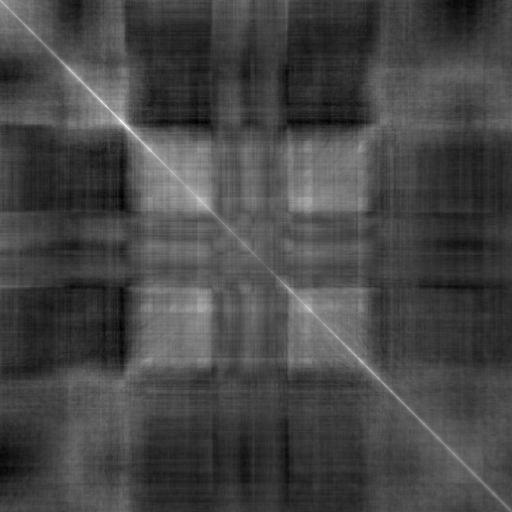

In [34]:
Gray.(value3(m))

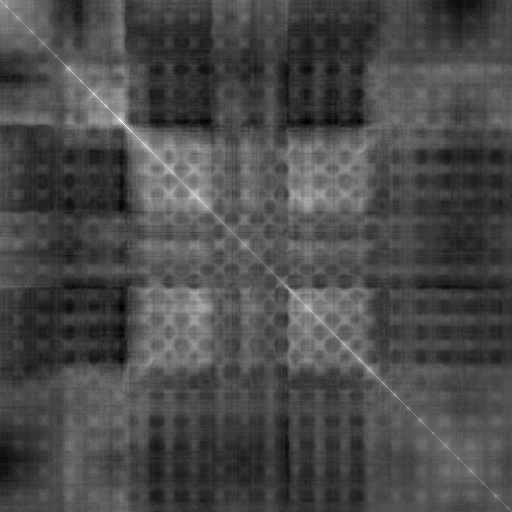

In [36]:
Gray.(value3(m_warped))

In [37]:
loss(x, y) = norm(value3(x) - y)

loss (generic function with 1 method)

In [39]:
using Flux

In [41]:
opt = Adam()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [42]:
import Flux.Optimise: update!

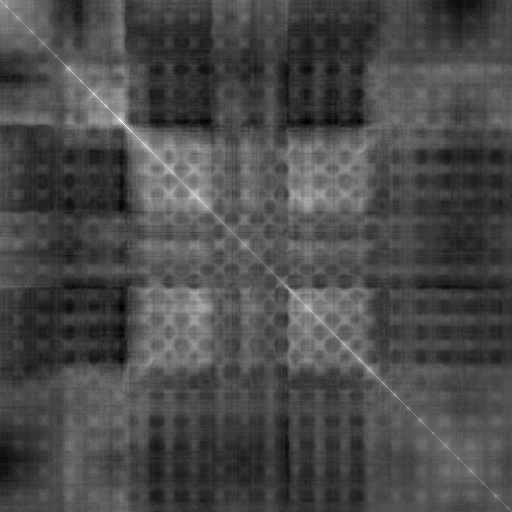

In [43]:
target_value = value3(m_warped)
Gray.(target_value)

In [44]:
loss(m, target_value)

20.400127148541408

In [49]:
using Flux: params

In [50]:
function steps!(x, y, loss, opt, accum, n_steps = 1)
    for i = 1:n_steps
        p = params(x)
        push!(accum, deepcopy(x)) # I am unhappy about the loss of intermediate parameter values
        grads = gradient(()->loss(x, y), p)
        update!(opt, p, grads)
        println(loss(x, y))
    end
    loss(x, y)
end

steps! (generic function with 2 methods)

In [51]:
m_list = []

Any[]

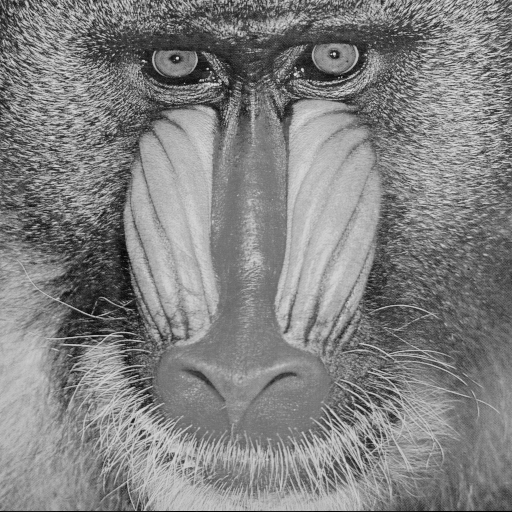

In [52]:
changing_m = deepcopy(m)
Gray.(changing_m)

In [53]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

18.930630322983284
17.998412994021663
17.49102277368788
17.132622834789604
16.851330043092876
16.59138300427991
16.32518628459641
16.042357027015182
15.753423332776885
15.47115470152106
15.2086242531216
14.971513118070408
14.756666971926457
14.554267388137148
14.352972296621905
14.14325650605451
13.928514170489615
13.71113797794682
13.5001301430233
13.3023172545383
13.120663717919092
12.952517498460958
12.791379084515114
12.63171537971038
12.467386258467764
12.300004974523647
12.133476944418415
11.971943429237648
11.81796635813659
11.670381784500519


11.670381784500519

In [54]:
length(m_list)

30

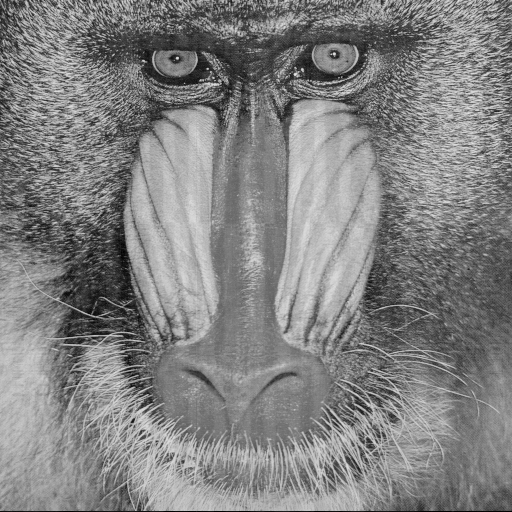

In [55]:
Gray.(changing_m)

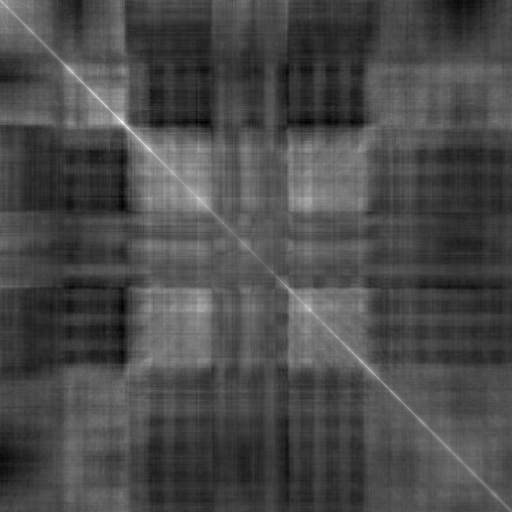

In [56]:
Gray.(value3(changing_m))

In [57]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

11.526739818603875
11.38280245640359
11.238307833650593
11.09335347166101
10.951457861900067
10.814259638829801
10.681433542509787
10.552453535475477
10.421454698092477
10.291258097262999
10.158899377100703
10.03381253150907
9.894362130728604
9.764308959092586
9.635956772976328
9.507931407987302
9.378682145237896
9.24826697539821
9.117780360634505
8.987843818611676
8.858797025736573
8.72995112489665
8.600616033427393
8.470746647333073
8.341620463018307
8.213794969468852
8.087860216197463
7.96342574762167
7.840354204696677
7.719358754134435


7.719358754134435

In [58]:
length(m_list)

60

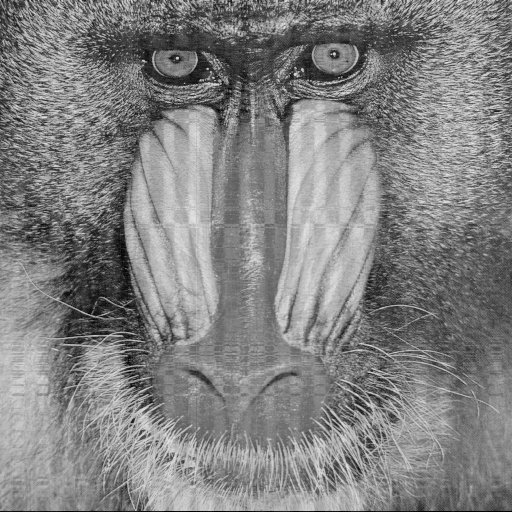

In [59]:
Gray.(changing_m)

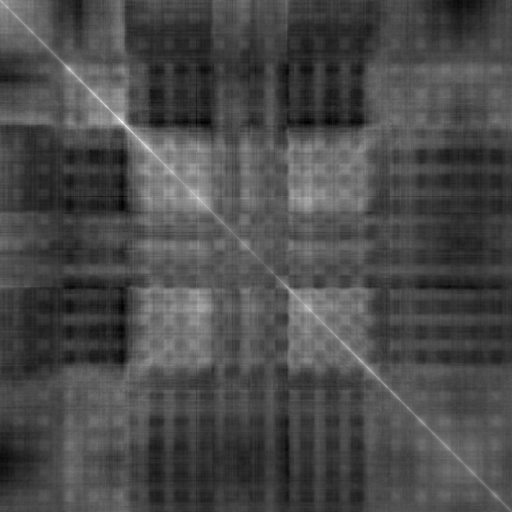

In [60]:
Gray.(value3(changing_m))

In [61]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

7.600912377576158
7.485591995418416
7.37334664307288
7.263844980380444
7.157537962454874
7.054707191562699
6.955754187614987
6.860665002785269
6.768340822799051
6.679453482183794
6.593819271025727
6.511279036891689
6.431469095239818
6.354007833003269
6.278767043008877
6.20598195436429
6.1350226435219755
6.0656899524987065
5.997885258813515
5.93155561758719
5.866623936642296
5.802875888399832
5.740162637693107
5.678694377315553
5.618268629449879
5.558892940290554
5.500436629984693
5.442955142677361
5.386420607325565
5.330825464200721


5.330825464200721

In [62]:
length(m_list)

90

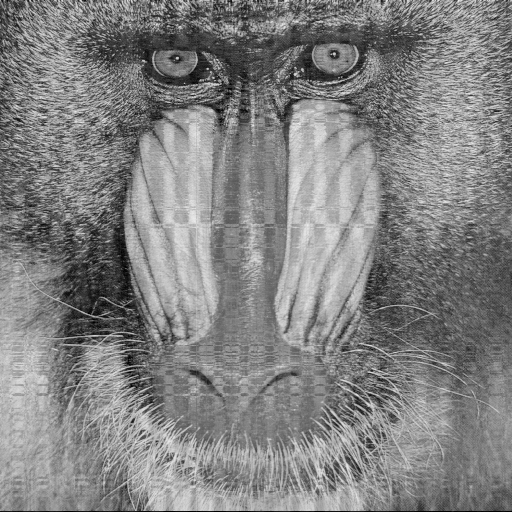

In [63]:
Gray.(changing_m)

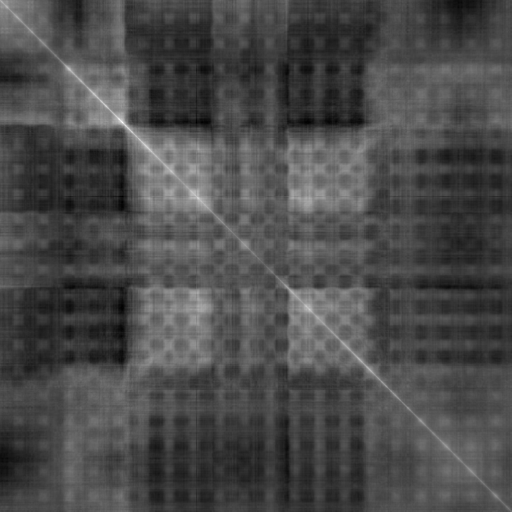

In [64]:
Gray.(value3(changing_m))

In [65]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

5.275976272056039
5.2219149278324
5.168701189951037
5.116133779452806
5.064183655560354
5.0128536416703575
4.962186251298247
4.911989859002138
4.862277438938646
4.81315430918578
4.764467078529363
4.716199941465463
4.6683792181494645
4.621049412546631
4.574177628117852
4.527806890080921
4.481876015212424
4.436394680129543
4.391442173495224
4.346871723273367
4.302855675713889
4.259239614352824
4.216151641704505
4.173445894019767
4.131211533935721
4.0894101756659476
4.048066868251233
4.007113281503297
3.9665921900606205
3.926409974062284


3.926409974062284

In [66]:
length(m_list)

120

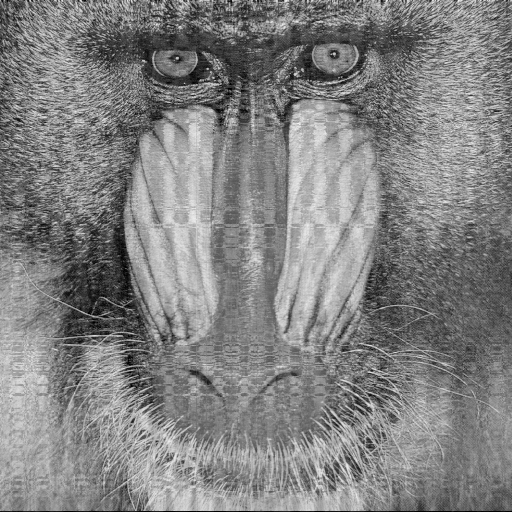

In [67]:
Gray.(changing_m)

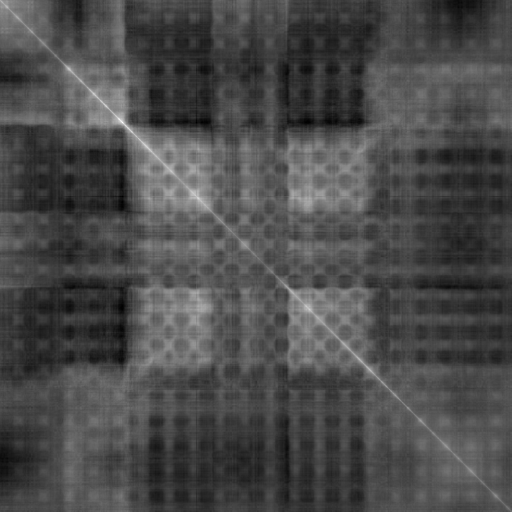

In [68]:
Gray.(value3(changing_m))

In [69]:
steps!(changing_m, target_value, loss, opt, m_list, 30)

3.8866718291465823
3.847326018612398
3.808281748832393
3.769669423487435
3.7313615436245016
3.6934794498769747
3.6559574913149726
3.6187428502713206
3.5818731654034597
3.545369325186703
3.5090859369409544
3.4731834351680475
3.4375963511118313
3.4022775342300577
3.36727914066531
3.332612993013531
3.2981690450640078
3.2640407223629544
3.2301917039557213
3.1965997762358644
3.1632846640108543
3.1301893450776914
3.097377082744058
3.064873288120281
3.032485704214577
3.00045320919473
2.96854321003529
2.936981278881347
2.9055107213777016
2.8743654773529497


2.8743654773529497

In [70]:
length(m_list)

150

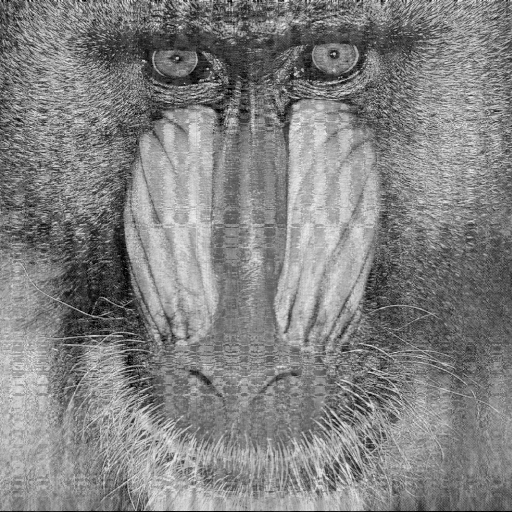

In [71]:
Gray.(changing_m)

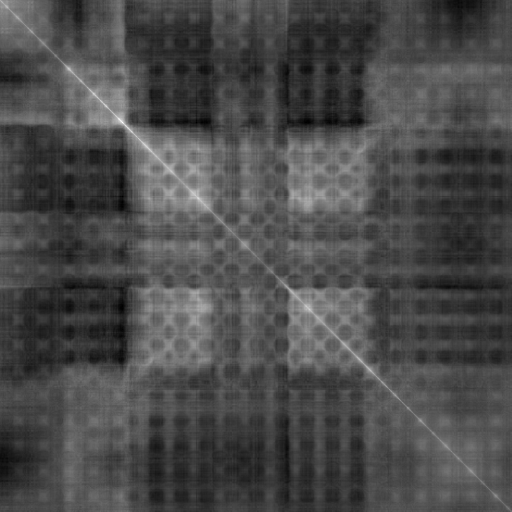

In [72]:
Gray.(value3(changing_m))

In [73]:
steps!(changing_m, target_value, loss, opt, m_list, 300)

2.843354378641152
2.812583160670396
2.7820591257692238
2.7517335262059492
2.7215976553494174
2.6916315195937033
2.6619144427626753
2.6323965657245765
2.603046607957928
2.5738926912967863
2.5449404871051207
2.5161874168659493
2.487581421998561
2.4591989952599485
2.4309924333376456
2.402958632159295
2.3751510694180773
2.347469199680888
2.3200752833522347
2.2927351012575814
2.2657296985453006
2.238748450418085
2.212111773056275
2.1854819948240305
2.1591289361895116
2.1329382848873513
2.1069352120481484
2.081200787575616
2.0554388357098166
2.0303626998601376
2.0050127067692687
1.9796549791216826
1.9551378518164342
1.929903764411067
1.9059977236479808
1.8812170999468445
1.8570918915295747
1.8334221637986907
1.809064945674462
1.7854782304567467
1.7619889351791247
1.7388384258892802
1.715798823160488
1.692880378116619
1.670770977975357
1.6483532840786668
1.6255336377827967
1.603314814668554
1.581557981761565
1.5598426240904075
1.538234634064081
1.5167769927768522
1.4956224067818724
1.47463784

0.18720979822560763

In [74]:
length(m_list)

450

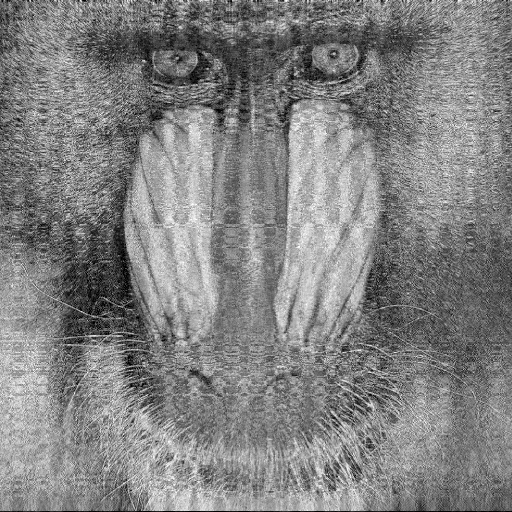

In [75]:
Gray.(changing_m)

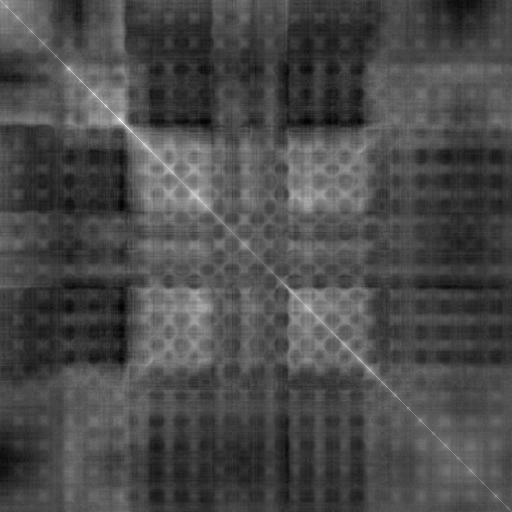

In [76]:
Gray.(value3(changing_m))

In [77]:
steps!(changing_m, target_value, loss, opt, m_list, 3000)

0.21538866739026552
0.23995819545900804
0.20652646749474576
0.179746865914228
0.18045399999290215
0.2085799902270496
0.22881628660408324
0.19642241570091093
0.18015620344698458
0.19018062602242738
0.21336147959882912
0.205100028959764
0.18514877170332064
0.18225161702031503
0.1974840609747614
0.21346482796115382
0.19610077467808448
0.17971439517239457
0.18467998487111237
0.2049715967851348
0.20506827685239473
0.1866015043552085
0.18073898321917284
0.19077043034196264
0.20013751260101914
0.18859870738459647
0.1818344877241958
0.1907987562162897
0.19394329925076928
0.18171628663474532
0.17673257235405992
0.18585866658656922
0.20125972792665806
0.19521108524989852
0.17906250591535441
0.1747333321397672
0.1837305154716728
0.19894324677347067
0.19073972140292475
0.16949753777428223
0.16928422836574952
0.19699869380470292
0.20204385170355696
0.16779248610989497
0.15498532508729468
0.16401221995547585
0.1925417845168687
0.19976547896324645
0.16960089915401708
0.15353120162518047
0.15988187497

0.39095585498175217
0.356951701705399
0.3264463672353502
0.3562176947101588
0.30241851324307106
0.3137244333166228
0.2971970821871533
0.27021468099949864
0.2762330826196299
0.2439621891078518
0.25081567612387246
0.22264076244065173
0.2280290682789586
0.20321424506140032
0.20927477493155663
0.18808614041556548
0.19840011847642203
0.174701320126648
0.19503250277714004
0.16585230671808787
0.16771898570666147
0.16191464000127828
0.1518055928774274
0.1598280823176335
0.1446031542252485
0.1458197162704665
0.1471012895565875
0.13442452851832107
0.1389067047561221
0.13565212191549939
0.12841337213861453
0.12411225693779863
0.12294647423554689
0.12354984644791946
0.11994131613964504
0.11393993474845777
0.11482174378588367
0.12921882479155383
0.13749064741247147
0.11488836136982804
0.1067093161879029
0.10668765309622971
0.10832527871739453
0.11278508691627355
0.11090738644359471
0.10253821534253563
0.09879767061289073
0.10454559693931198
0.11694212002839573
0.12282865353564942
0.1169791702629359

0.10320336815607027
0.09425437519332074
0.09446559407018437
0.0979789865121357
0.0955043679294873
0.09381692026216962
0.09211867964130259
0.10040631309877247
0.09092800869573839
0.09072687943679109
0.09862432847162013
0.09131964884000753
0.0985684782605158
0.09212161230643334
0.09138893962245884
0.10083547852976062
0.09027229534429501
0.09519811088190432
0.09539461422013562
0.0913800812824417
0.09497160396636828
0.09067684782227381
0.09334942768902332
0.09131707668341126
0.08949533808095243
0.09829703107572323
0.09229930040677764
0.0940488491639207
0.09609548227243321
0.10031651632224355
0.10093072702927686
0.09291542444434321
0.0987028630865049
0.0862940628624253
0.09186440456307911
0.1036838776595344
0.09100654995177378
0.10232289080341486
0.09331293710010186
0.09337274816577132
0.0998967649549064
0.0892780566249208
0.09750285802057873
0.09475768012463122
0.09401320656374024
0.09759719759278371
0.09427149411755383
0.0984693131641703
0.09346063268025524
0.09125117908408367
0.098993213

0.0838024109717516
0.07906430365816468
0.08386530414564289
0.0782506222676261
0.08239803591391488
0.0798877527217365
0.07991173918702744
0.0823277839149023
0.08022225970240991
0.08580488316687251
0.07734523661471365
0.0820589604089184
0.08081461695801138
0.08367919754155359
0.08255236708426451
0.0828790958877056
0.07836802030595737
0.07888512852218836
0.0817020971773903
0.07516104986350841
0.08140016806741489
0.0791813658474175
0.08104324664905353
0.08685464493022159
0.07999549891064435
0.08561569958306926
0.08207087573472753
0.08477067048025742
0.08477680295962654
0.08203202415563302
0.0800630385692263
0.07815341863043573
0.08101844456613008
0.0806100132430151
0.07881185621258098
0.08198609608377425
0.08207544996924242
0.07697379518234074
0.0806370087874972
0.07888307752514331
0.08079628239055452
0.08660644044961252
0.08320434261906721
0.08567287402091259
0.08510376591673928
0.08235480774065503
0.08075682898125505
0.08251279740419165
0.0808979074825272
0.08189117084509033
0.0864797090

0.5697110417265838
0.660523345338439
0.6537795783439755
0.47906256615113985
0.39773246294180903
0.7369673350318058
0.6711613809428808
0.44842500736402746
0.4033892459818362
0.6695546568076992
0.5804366988158836
0.5185169199489478
0.4833344308096142
0.568581813392342
0.4991099200020659
0.5681714729209205
0.5279955084946473
0.5046522186906971
0.4386632236588368
0.589729504846183
0.5340027219666377
0.48708774552923545
0.44003738386210567
0.5598481334644
0.4973889511397032
0.4960889821113388
0.45874323462393524
0.5130544661811663
0.4567440508359101
0.5105178480522335
0.47355154303982255
0.47343452197856806
0.41858239468663105
0.5373368332028614
0.4835078119425852
0.44924949177080886
0.3908617321768769
0.5374532225285966
0.4834411212225934
0.4331280769621378
0.38088642543211504
0.5372816382950872
0.484161141078498
0.42540468194357667
0.3733873122897108
0.5174631513960108
0.468655186404199
0.416578048893213
0.37344037738586716
0.5038071127865993
0.4615307472871078
0.4208274244232743
0.369401

0.26198354805471274
0.24172179190269855
0.26003132370092735
0.23021586100831262
0.2631531087616708
0.23981502436182586
0.26096506875925385
0.23313739762129035
0.26822503309014745
0.23776191917164388
0.2618012254268077
0.2256267120294286
0.26517692695489514
0.23968686892636037
0.2602550737901098
0.22717858881800557
0.2671011043144237
0.2392316524078837
0.26125806717493055
0.23323196523605916
0.2675037318082731
0.24073421069480344
0.2638966569423744
0.23327892069918307
0.27158550508931445
0.24050010560101695
0.265157752887417
0.23395223556452902
0.27128450149495165
0.24069236609304756
0.26092974503652333
0.23780441257636709
0.27133339775848964
0.2430039919730137
0.2595101625136151
0.2351685023913018
0.26585946426644397
0.2435786361218975
0.25928990715551226
0.2344477923424117
0.2631312271063797
0.24357115103582916
0.25894121530828196
0.2316850822501771
0.2619654253525088
0.24260568566292018
0.26288966315505896
0.22953070748490548
0.2630008908881123
0.23984076582087852
0.25422728676410683

0.20683354550711577
0.21786662576807045
0.19585264595026894
0.23356412753520434
0.20828663580892912
0.2197727236025482
0.20018304527182107
0.23119911737462728
0.2089106083241274
0.21859429948353196
0.19702099729630881
0.23270092855547675
0.20778917609217504
0.21506567240566085
0.19663130728414663
0.23199100455932523
0.21093338827457184
0.22111163199255077
0.20201697665153392
0.23385579981504692
0.21052744580670674
0.22125124465454907
0.20087451268176817
0.23063640628014578
0.20722883434840508
0.22210904094495085
0.19644841184989553
0.2289379362700046
0.20836082217735485
0.21798717640640683
0.1925637414960666
0.2326310195983524
0.20978723015842518
0.22341053075796963
0.19344133908940125
0.2328567026334997
0.21114066950880997
0.2255231600023844
0.19271648909679578
0.22826598107181226
0.2106519001113266
0.22153573849463717
0.19465536051878496
0.2334958411554516
0.21021008730659888
0.21997954958362995
0.19994005660056569
0.22787274514473704
0.20887176323929982
0.22543253227450188
0.1986575

0.21651277592415652
0.19969501786101068
0.20347042247034017
0.18512801358617476
0.2188513617266296
0.2007854111064512
0.2045570889547481
0.18369729532790466
0.21911859811017537
0.19663622800270278
0.2062702349893631
0.18372327849870615
0.21942179221238817
0.19604140634254313
0.20180491951640397
0.18757756708376527
0.21466177680717136
0.1954863002318634
0.20146641827127104
0.18666970222480928
0.21054828081694543
0.19217991700778644
0.20071021674934178
0.18653408248179815
0.2124990379575171
0.1947696711568871
0.20449549271269007
0.18199625084960727
0.21234983983493583
0.19110885068338967
0.2077426684893928
0.18236434593133166
0.21517033619800172
0.18821515044568157
0.20927537682730266
0.18083408760621003
0.21320123732154267
0.18860133710314966
0.20810209642519678
0.18081781073234385
0.21393477700385827
0.1903854892206304
0.21024739529985217
0.18250110310141984
0.21593233992976474
0.19176977915056997
0.20657820106812255
0.18717351945884372
0.21444940585785563
0.1905267546770289
0.20739178

0.20121933328361635

In [78]:
length(m_list)

3450

In [79]:
# Compute losses and store values with indices
losses_with_indices = [(loss(x, target_value), i) for (i, x) in enumerate(m_list)]

# Sort by loss value and take the five smallest
sorted_losses = sort(losses_with_indices, by = first)
five_smallest = sorted_losses[1:5]

# Print the five smallest losses with their indices
for (loss_value, index) in five_smallest
    println("Index: $index, Loss: $loss_value")
end

Index: 1977, Loss: 0.021701636208151232
Index: 2024, Loss: 0.03872412019819424
Index: 1975, Loss: 0.04751570788377518
Index: 1979, Loss: 0.05559020676085594
Index: 2019, Loss: 0.056194516886786776


In [80]:
x1977 = m_list[1977]

512×512 Matrix{Float32}:
 0.530303  0.268622   0.040295   …  0.35542    0.734831    0.777368
 0.446918  0.269814   0.0248046     0.475043   0.560718    0.496744
 0.392812  0.377352   0.316502      0.418354   0.387571    0.47613
 0.453186  0.45559    0.459344      0.407045   0.408458    0.392593
 0.325865  0.383007   0.512713      0.349566   0.493195    0.443705
 0.322894  0.376159   0.418028   …  0.310798   0.537178    0.596404
 0.36562   0.399148   0.477677      0.577767   0.542642    0.481426
 0.374726  0.367717   0.333803      0.497247   0.46686     0.479289
 0.489519  0.21423    0.263611      0.552155   0.677529    0.48972
 0.391625  0.294038   0.411807      0.308161   0.472749    0.6191
 0.327872  0.309394   0.266452   …  0.205737   0.472214    0.378913
 0.304422  0.268215   0.391596      0.404      0.394631    0.338616
 0.22771   0.368671   0.472962      0.2761     0.447314    0.478726
 ⋮                               ⋱             ⋮          
 0.558849  0.684778   0.56023    …  

In [81]:
loss(x1977, target_value)

0.021701636208151232

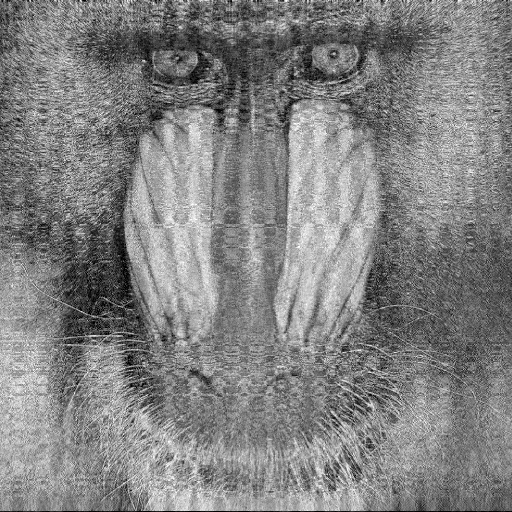

In [82]:
Gray.(x1977)

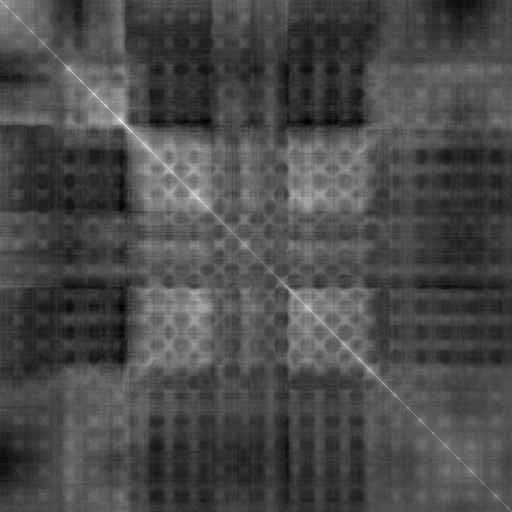

In [83]:
Gray.(value3(x1977))

In [84]:
loss(m_list[450], target_value)

0.18235084788838332

In [85]:
loss(m_list[451], target_value)

0.18720979822560763